In [10]:
import cv2 as cv
import datetime

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import os
from numba import jit
import struct
from open3d import *
import open3d as o3d


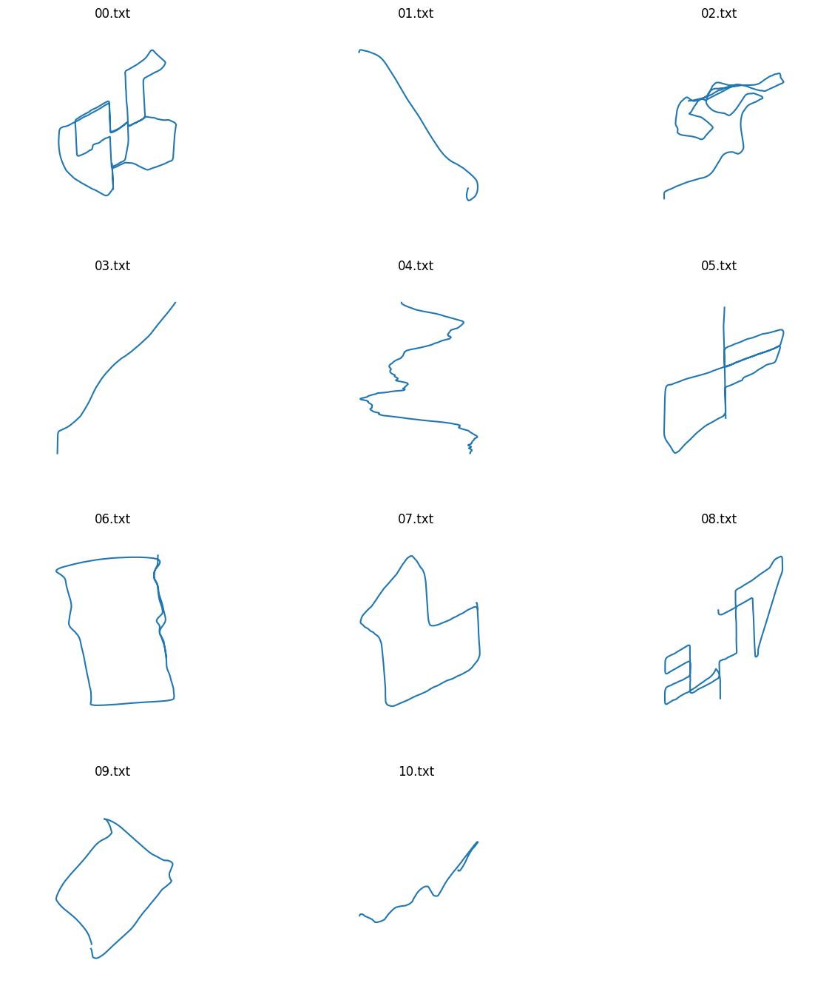

In [11]:
dataset_path = "/home/muhammed/ara/dataset"
poses_path = dataset_path + "/poses/"
sequences_path = dataset_path + "/sequences/"
sequences_dir_list =  sorted(os.listdir(sequences_path))

poses_file_list =  sorted(os.listdir(poses_path))

list_poses = list()
for file_name in poses_file_list:
    p = np.loadtxt(poses_path+file_name, dtype=float)
    p = p.reshape( p.shape[0], 3, 4)
    list_poses.append(p)

list_calib = list()
list_times = list()

for dir in sequences_dir_list:
    c_data = np.loadtxt(sequences_path+dir+"/calib.txt", delimiter=' ', usecols=range(1,13), dtype=float)

    colib_data = [np.array(i).reshape(3,4) for i in c_data]
  
    list_calib.append(np.array(colib_data))
    times_data = np.loadtxt(sequences_path+dir+"/times.txt", dtype=float)
    list_times.append(np.array(times_data))


fig = plt.figure(figsize=(15,17))

for i in range(len(list_poses)):
    ax = fig.add_subplot(4,3,i+1, projection='3d')
    ax.plot(list_poses[i][:, :, 3][:, 0], list_poses[i][:, :, 3][:, 1], list_poses[i][:, :, 3][:, 2])
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')
    ax.title.set_text(poses_file_list[i])
    plt.axis('off')
    plt.grid(False)
    ax.view_init(elev=-40, azim=270)



In [12]:
pp = list_poses[0][4]

cameraMatrix, rotMatrix, transVect, rotMatrixX, rotMatrixY, rotMatrixZ, eulerAngles = cv.decomposeProjectionMatrix(pp)
print(cameraMatrix.round(4))
print(f'rotation matrix:\n {rotMatrix.round(3)}')
trVe = transVect/transVect[3]
print(f'tranlation vector:\n{trVe.round(4)}')
print(f'euler angles:\nAlpha = {eulerAngles[0]}\nBeta = {eulerAngles[1]}\nGamma = {eulerAngles[2]}')

[[ 1. -0.  0.]
 [ 0.  1. -0.]
 [ 0.  0.  1.]]
rotation matrix:
 [[ 1.     0.002 -0.008]
 [-0.002  1.    -0.005]
 [ 0.008  0.005  1.   ]]
tranlation vector:
[[ 0.1589]
 [ 0.098 ]
 [-3.4346]
 [ 1.    ]]
euler angles:
Alpha = [0.2654699]
Beta = [-0.47291315]
Gamma = [-0.12128014]


In [13]:
orgin = np.array([0,0,0])
pose_points = list()
pp =orgin
for pose in list_poses[0]:
    pose_points.append(pp)
    p = np.matmul(pose,np.hstack([orgin,[1]]).transpose())
    _, _, transVect, _, _, _, eulerAngles = cv.decomposeProjectionMatrix(pose)
    trVe = transVect/transVect[3]
    pp = p



In [14]:
# fig = plt.figure()
# ax = fig.add_subplot(projection='3d')
# for p in pose_points:
#     xs = p[0]
#     ys = p[1]
#     zs = p[2]
#     ax.scatter(xs, ys, zs, marker='.',color='#1f77b4')
# ax.scatter(0, 0, 0, marker='^',color='#ff0000')
# ax.set_xlabel('X Label')
# ax.set_ylabel('Y Label')
# ax.set_zlabel('Z Label')
# ax.view_init(elev=-40, azim=270)
# plt.show()

In [5]:
Tr = list_calib[0][4]
def convert_kitti_bin_to_xyz_transformed(binFilePath):
    size_float = 4
    list_xyz = []
    with open(binFilePath, "rb") as f:
        byte = f.read(size_float * 4)
        while byte:
            x, y, z, intensity = struct.unpack("ffff", byte)
            point = np.array([x, y, z])
            Tr_P = np.matmul(Tr,np.hstack([point,[1]]).transpose())
            list_xyz.append(Tr_P)
            byte = f.read(size_float * 4)
    return list_xyz
def convert_kitti_bin_to_xyz(binFilePath):
    size_float = 4
    list_xyz = []
    list_intensity = []
    with open(binFilePath, "rb") as f:
        byte = f.read(size_float * 4)
        while byte:
            x, y, z, intensity = struct.unpack("ffff", byte)
            point = np.array([x, y, z])
            
            list_intensity.append(intensity)
            list_xyz.append(point)
            byte = f.read(size_float * 4)
    return list_xyz ,list_intensity

In [6]:
list_xyz_transformed = list()
list_xyz = list()
list_intensity = list()
velodyne_file_list = sorted(os.listdir(sequences_path+sequences_dir_list[0]+"/velodyne/"))

for i in range(10):
    bin_file = sequences_path+sequences_dir_list[0]+"/velodyne/"+velodyne_file_list[i]
    xyz_val,intensity_val= convert_kitti_bin_to_xyz(bin_file)
    xyz_transformed = convert_kitti_bin_to_xyz_transformed(bin_file)
    list_xyz.append(xyz_val)
    list_intensity.append(intensity_val)
    list_xyz_transformed.append(xyz_transformed)


In [7]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(np.array(list_xyz[0]))

origin = o3d.geometry.TriangleMesh.create_coordinate_frame(size=0.5)
geometries = [pcd, origin]
# Visualize:
o3d.visualization.draw_geometries(geometries)
# o3d.visualization.draw_geometries([pcd],window_name='first points cloud',point_show_normal=True)

In [11]:
pcd_t = o3d.geometry.PointCloud()
pcd_t.points = o3d.utility.Vector3dVector(np.array(list_xyz_transformed[0]))
origin = o3d.geometry.TriangleMesh.create_coordinate_frame(size=0.5)
geometries = [pcd_t, origin]
# Visualize:
o3d.visualization.draw_geometries(geometries)

In [12]:
@jit(nopython=True)
def fill_valsv2(intensity_img,v,u,i):
    for vv,uu,ii in zip(v,u,i):
        intensity_img[int(uu)][int(vv)] = np.round((ii)*255)
    return intensity_img
def convert_intensityCloudPoints_to_img(xyz,intensity,rows,cols):
    x = np.asarray(xyz[:,0])
    y = np.asarray(xyz[:,1])
    z = np.asarray(xyz[:,2])
    R=np.sqrt(x*x+y*y+z*z)
    pitch =np.arcsin(z/R)
    yaw = np.arctan2(y,x)
    FOV_up = np.max(pitch)
    FOV_down = np.min(pitch)
    FOV = FOV_up - FOV_down
    u = rows*((FOV_up - pitch)/(FOV))
    v = cols*((yaw+np.pi)/(2*np.pi))
    v = np.round(v)
    u = np.round(u)
    img = np.zeros((rows+1, cols+1),dtype=np.uint8)
    img = fill_valsv2(img,v,u,intensity)
    img = cv.medianBlur(img,3)
    return img

In [13]:
@jit(nopython=True)
def fill_vals(img,v,u,R):
    for vv,uu,rr in zip(v,u,R):
        img[int(uu)][int(vv)] = np.round((rr/120)*255)
    return img
def convert_cloudPoints_to_img(xyz,rows,cols):
    x = np.asarray(xyz[:,0])
    y = np.asarray(xyz[:,1])
    z = np.asarray(xyz[:,2])
    R=np.sqrt(x*x+y*y+z*z)
    pitch =np.arcsin(z/R)
    yaw = np.arctan2(y,x)
    FOV_up = np.max(pitch)
    FOV_down = np.min(pitch)
    FOV = FOV_up - FOV_down
    u = rows*((FOV_up - pitch)/(FOV))
    v = cols*((yaw+np.pi)/(2*np.pi))
    v = np.round(v)
    u = np.round(u)
    img = 255*np.ones((rows+1, cols+1),dtype=np.uint8)
    img = fill_vals(img,v,u,R)
    img = cv.medianBlur(img,3)
    return img

def convert_transformed_cloudPoints_to_img(xyz,rows,cols):
    x = np.asarray(xyz[:,0])
    z = np.asarray(xyz[:,1])
    y = np.asarray(xyz[:,2])
    R=np.sqrt(x*x+y*y+z*z)
    pitch =np.arcsin(z/R)
    yaw = np.arctan2(y,x)
    FOV_up = np.max(pitch)
    FOV_down = np.min(pitch)
    FOV = FOV_up - FOV_down
    u = rows*((FOV_up - pitch)/(FOV))
    v = cols*((yaw+np.pi)/(2*np.pi))
    v = np.round(v)
    u = np.round(u)
    img = 255*np.ones((rows+1, cols+1),dtype=np.uint8)
    img = fill_vals(img,v,u,R)
    img = cv.medianBlur(img,3)
    return img

In [70]:
list_img360 = list()
list_img360_t = list()
list_intensity_img = list()   
for xyz,xyz_t,inten in zip(list_xyz, list_xyz_transformed,list_intensity):
    img = convert_cloudPoints_to_img(np.asarray(xyz),64,1024)
    img_t = convert_transformed_cloudPoints_to_img(np.asarray(xyz_t),64,1024)
    intensity_img = convert_intensityCloudPoints_to_img(np.asarray(xyz), np.asarray(inten),64,1024)
    list_intensity_img.append(intensity_img)
    list_img360.append(img)
    list_img360_t.append(img_t)


0.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
1.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
1.0
0.0
1.0
0.0
1.0
0.0
1.0
1.0
0.0
1.0
1.0
0.0
1.0
0.0
1.0
0.0
0.0
1.0
1.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
1.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
0.0
1.0
0.0
1.0
0.0
0.0
0.0
0.0
0.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
0.0
1.0
0.0
1.0
1.0
0.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.0
1.0
1.0
1.0
1.0
1.0


In [72]:
for im in list_intensity_img:
    cv.imshow("intensity_img",im)
    cv.waitKey(0)
cv.destroyAllWindows()

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread (0x55e94c0).
Cannot move to target thread (0x53c2790)

QObject::moveToThread: Current thread (0x53c2790) is not the object's thread